In [14]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
import torch
import torch.nn as nn
import torch.nn.functional as F

print("Basic libraries imported successfully.")


Basic libraries imported successfully.


In [15]:
# Import domain-specific libraries (ensure dependencies are installed)
try:
    from rdkit import Chem
    from rdkit.Chem import Descriptors
    from deepchem.molnet import load_toxcast
    from torch_geometric.data import Data, DataLoader
    from torch_geometric.nn import GATConv, global_mean_pool
    print("Domain-specific libraries imported successfully.")
except ModuleNotFoundError as e:
    print(f"Error importing libraries: {e}")


Domain-specific libraries imported successfully.


In [16]:
# Load ToxCast dataset with error handling
try:
    toxcast_tasks, datasets, transformers = load_toxcast(
        featurizer='Raw',
        splitter='scaffold',
        reload=True
    )
    train_dataset, valid_dataset, test_dataset = datasets
    print("ToxCast dataset loaded successfully.")
except Exception as e:
    print(f"Error loading dataset: {e}")


ToxCast dataset loaded successfully.


In [17]:
# Explore train_dataset structure (if loaded successfully)
try:
    print(f"Number of tasks (assays): {len(toxcast_tasks)}")
    print(f"Training set size: {len(train_dataset)}")
    print(f"Shape of assay data: {train_dataset.y.shape}")
except Exception as e:
    print(f"Error exploring dataset structure: {e}")


Number of tasks (assays): 617
Training set size: 6863
Shape of assay data: (6863, 617)


In [18]:
from torch_geometric.data import Data

# Function to convert SMILES to graph
def smiles_to_graph(smiles, assay_data):
    mol = Chem.MolFromSmiles(smiles)
    if not mol:
        return None

    # Node features: Atomic number, degree, aromaticity
    x = torch.tensor([
        [atom.GetAtomicNum(), atom.GetDegree(), atom.GetIsAromatic()]
        for atom in mol.GetAtoms()
    ], dtype=torch.float)

    # Edge indices: Bonds between atoms
    edge_index = []
    for bond in mol.GetBonds():
        i = bond.GetBeginAtomIdx()
        j = bond.GetEndAtomIdx()
        edge_index.extend([[i, j], [j, i]])  # Undirected edges

    edge_index = torch.tensor(edge_index).t().contiguous()  # Shape: [2, num_edges]

    # Labels: Assay data
    y = torch.tensor(assay_data, dtype=torch.float)  # Shape: [617]

    return Data(x=x, edge_index=edge_index, y=y)

# Create graph dataset
graph_data = []
for idx in range(len(df)):
    graph = smiles_to_graph(df['SMILES'][idx], df['Assay_Data'][idx])
    if graph is not None:
        graph_data.append(graph)

print(f"Created {len(graph_data)} graph data objects.")
print("Example graph:")
print(graph_data[0])


[17:25:03] WARNING: not removing hydrogen atom without neighbors


Created 6863 graph data objects.
Example graph:
Data(x=[15, 3], edge_index=[2, 28], y=[617])


In [19]:
for i in range(3):  # Check first 3 graphs
    print(f"Graph {i}:")
    print(f"Node features shape: {graph_data[i].x.shape}")
    print(f"Edge indices shape: {graph_data[i].edge_index.shape}")
    print(f"Labels shape: {graph_data[i].y.shape}")


Graph 0:
Node features shape: torch.Size([15, 3])
Edge indices shape: torch.Size([2, 28])
Labels shape: torch.Size([617])
Graph 1:
Node features shape: torch.Size([12, 3])
Edge indices shape: torch.Size([2, 22])
Labels shape: torch.Size([617])
Graph 2:
Node features shape: torch.Size([9, 3])
Edge indices shape: torch.Size([2, 12])
Labels shape: torch.Size([617])


In [20]:
from torch_geometric.nn import GATConv, global_mean_pool

# Define the GNN model
class ToxGNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = GATConv(in_channels=3, out_channels=64)  # Input: Node features (3), Output: Hidden dim (64)
        self.conv2 = GATConv(64, 32)  # Second GAT layer
        self.classifier = nn.Linear(32, 617)  # Output: 617 assays

    def forward(self, data):
        x, edge_index, batch = data.x, data.edge_index, data.batch

        # Apply GAT layers
        x = self.conv1(x, edge_index).relu()  # Shape: [total_nodes_in_batch, 64]
        x = self.conv2(x, edge_index).relu()  # Shape: [total_nodes_in_batch, 32]

        # Pool to graph-level features
        x = global_mean_pool(x, batch)  # Shape: [batch_size, 32]

        # Final classifier
        return torch.sigmoid(self.classifier(x))  # Shape: [batch_size, 617]

print("GNN model defined successfully.")


GNN model defined successfully.


In [21]:
from torch_geometric.loader import DataLoader

# Create DataLoader
batch_size = 32
data_loader = DataLoader(graph_data, batch_size=batch_size, shuffle=True)

# Verify one batch
for batch in data_loader:
    print("Batch example:")
    print(f"Node features shape: {batch.x.shape}")
    print(f"Edge indices shape: {batch.edge_index.shape}")
    print(f"Batch vector shape: {batch.batch.shape}")
    print(f"Labels shape: {batch.y.shape}")
    break


Batch example:
Node features shape: torch.Size([522, 3])
Edge indices shape: torch.Size([2, 1050])
Batch vector shape: torch.Size([522])
Labels shape: torch.Size([19744])


In [23]:
# Training loop with fixed loss calculation
epochs = 10
for epoch in range(epochs):
    model.train()
    total_loss = 0

    for batch in data_loader:
        batch = batch.to(device)

        # Forward pass
        outputs = model(batch)  # Shape: [batch_size, 617]

        # Reshape targets to match outputs
        targets = batch.y.view(outputs.shape)  # Ensure targets have shape [batch_size, 617]

        # Calculate loss
        loss = criterion(outputs, targets)  # Shapes now match

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    print(f"Epoch {epoch+1}/{epochs}, Loss: {total_loss/len(data_loader):.4f}")


ValueError: Expected 'edge_index' to be of integer type (got 'torch.float32')

In [24]:
from torch_geometric.data import Data

def smiles_to_graph(smiles, assay_data):
    mol = Chem.MolFromSmiles(smiles)
    if not mol:
        return None

    # Node features: Atomic number, degree, aromaticity
    x = torch.tensor([
        [atom.GetAtomicNum(), atom.GetDegree(), atom.GetIsAromatic()]
        for atom in mol.GetAtoms()
    ], dtype=torch.float)

    # Edge indices: Bonds between atoms
    edge_index = []
    for bond in mol.GetBonds():
        i = bond.GetBeginAtomIdx()
        j = bond.GetEndAtomIdx()
        edge_index.extend([[i, j], [j, i]])  # Undirected edges

    edge_index = torch.tensor(edge_index, dtype=torch.long).t().contiguous()  # Ensure int type and correct shape

    # Labels: Assay data
    y = torch.tensor(assay_data, dtype=torch.float)  # Shape: [617]

    return Data(x=x, edge_index=edge_index, y=y)


In [25]:
# Verify edge_index data types for the first few graphs
for i in range(3):
    print(f"Graph {i} edge_index dtype: {graph_data[i].edge_index.dtype}")


Graph 0 edge_index dtype: torch.int64
Graph 1 edge_index dtype: torch.int64
Graph 2 edge_index dtype: torch.int64


In [26]:
# Verify edge_index dtype during training
for batch in data_loader:
    print(f"Batched edge_index dtype: {batch.edge_index.dtype}")
    break


Batched edge_index dtype: torch.int64


# Trail two

In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
import torch.nn.functional as F
from rdkit import Chem
from rdkit.Chem import Descriptors
from deepchem.molnet import load_toxcast
from torch_geometric.data import Data, DataLoader
from torch_geometric.nn import GATConv, global_mean_pool

print("Libraries imported successfully.")


Libraries imported successfully.


In [28]:
# Load ToxCast dataset with raw SMILES strings and assay data
toxcast_tasks, datasets, transformers = load_toxcast(
    featurizer='Raw',
    splitter='scaffold',
    reload=True
)
train_dataset, valid_dataset, test_dataset = datasets

# Check dataset details
print(f"Number of tasks (assays): {len(toxcast_tasks)}")
print(f"Training set size: {len(train_dataset)}")
print(f"Shape of assay data: {train_dataset.y.shape}")


Number of tasks (assays): 617
Training set size: 6863
Shape of assay data: (6863, 617)


In [33]:
# Convert training dataset to a DataFrame for easier handling
df = pd.DataFrame({
    'SMILES': train_dataset.ids,
    'Assay_Data': list(train_dataset.y)  # Convert numpy array to list for compatibility
})

# Display the first few rows and check the shape of the DataFrame
print("First 3 rows of the dataset:")
print(f"DataFrame shape: {df.shape}")

df.head(3)

First 3 rows of the dataset:
DataFrame shape: (6863, 2)


,SMILES,Assay_Data
0,C[SiH](C)O[Si](C)(C)O[Si](C)(C)O[SiH](C)C,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1,CCCCCCCC(OC)OC,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,[Ba++].[O-][N+]([O-])=O.[O-][N+]([O-])=O,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


In [34]:
# Verify SMILES conversion for the first 5 samples
for i in range(5):
    smiles = df['SMILES'][i]
    mol = Chem.MolFromSmiles(smiles)
    print(f"SMILES {i}: {smiles}")
    print(f"Is valid molecule? {'Yes' if mol else 'No'}")


SMILES 0: C[SiH](C)O[Si](C)(C)O[Si](C)(C)O[SiH](C)C
Is valid molecule? Yes
SMILES 1: CCCCCCCC(OC)OC
Is valid molecule? Yes
SMILES 2: [Ba++].[O-][N+]([O-])=O.[O-][N+]([O-])=O
Is valid molecule? Yes
SMILES 3: Cl[Nd](Cl)Cl
Is valid molecule? Yes
SMILES 4: Cl[Dy](Cl)Cl
Is valid molecule? Yes


In [35]:
# Function to convert SMILES to graph representation
def smiles_to_graph(smiles, assay_data):
    mol = Chem.MolFromSmiles(smiles)
    if not mol:
        return None

    # Node features: Atomic number, degree, aromaticity
    x = torch.tensor([
        [atom.GetAtomicNum(), atom.GetDegree(), atom.GetIsAromatic()]
        for atom in mol.GetAtoms()
    ], dtype=torch.float)

    # Edge indices: Bonds between atoms
    edge_index = []
    for bond in mol.GetBonds():
        i = bond.GetBeginAtomIdx()
        j = bond.GetEndAtomIdx()
        edge_index.extend([[i, j], [j, i]])  # Undirected edges

    edge_index = torch.tensor(edge_index, dtype=torch.long).t().contiguous()  # Ensure correct type

    # Labels: Assay data
    y = torch.tensor(assay_data, dtype=torch.float)  # Shape: [617]

    return Data(x=x, edge_index=edge_index, y=y)

# Create graph dataset from DataFrame
graph_data = []
for idx in range(len(df)):
    graph = smiles_to_graph(df['SMILES'][idx], df['Assay_Data'][idx])
    if graph is not None:
        graph_data.append(graph)

print(f"Created {len(graph_data)} graph data objects.")


[17:40:49] WARNING: not removing hydrogen atom without neighbors


Created 6863 graph data objects.


In [36]:
# Inspect the first few graphs in the dataset
for i in range(3):
    print(f"Graph {i}:")
    print(f"Node features shape: {graph_data[i].x.shape}")
    print(f"Edge indices shape: {graph_data[i].edge_index.shape}")
    print(f"Labels shape: {graph_data[i].y.shape}")


Graph 0:
Node features shape: torch.Size([15, 3])
Edge indices shape: torch.Size([2, 28])
Labels shape: torch.Size([617])
Graph 1:
Node features shape: torch.Size([12, 3])
Edge indices shape: torch.Size([2, 22])
Labels shape: torch.Size([617])
Graph 2:
Node features shape: torch.Size([9, 3])
Edge indices shape: torch.Size([2, 12])
Labels shape: torch.Size([617])


In [37]:
from torch_geometric.loader import DataLoader

# Create DataLoader for batching
batch_size = 32
data_loader = DataLoader(graph_data, batch_size=batch_size, shuffle=True)

# Verify one batch
for batch in data_loader:
    print("Batch example:")
    print(f"Node features shape: {batch.x.shape}")  # Total nodes in the batch
    print(f"Edge indices shape: {batch.edge_index.shape}")  # Total edges in the batch
    print(f"Batch vector shape: {batch.batch.shape}")  # Maps nodes to graphs
    print(f"Labels shape: {batch.y.shape}")  # Batched labels
    break


Batch example:
Node features shape: torch.Size([458, 3])
Edge indices shape: torch.Size([2, 912])
Batch vector shape: torch.Size([458])
Labels shape: torch.Size([19744])


In [38]:
from torch_geometric.nn import GATConv, global_mean_pool

# Define the GNN model
class ToxGNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = GATConv(in_channels=3, out_channels=64)  # Input: Node features (3), Output: Hidden dim (64)
        self.conv2 = GATConv(64, 32)  # Second GAT layer
        self.classifier = nn.Linear(32, 617)  # Output: 617 assays

    def forward(self, data):
        x, edge_index, batch = data.x, data.edge_index, data.batch

        # Apply GAT layers
        x = self.conv1(x, edge_index).relu()  # Shape: [total_nodes_in_batch, 64]
        x = self.conv2(x, edge_index).relu()  # Shape: [total_nodes_in_batch, 32]

        # Pool to graph-level features
        x = global_mean_pool(x, batch)  # Shape: [batch_size, 32]

        # Final classifier
        return torch.sigmoid(self.classifier(x))  # Shape: [batch_size, 617]

print("GNN model defined successfully.")


GNN model defined successfully.


In [40]:
# Initialize model and optimizer
device = torch.device('cpu')
model = ToxGNN().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.BCEWithLogitsLoss()  # Binary classification loss for multi-task learning

# Training loop
# Training loop with fixed target reshaping
epochs = 10
for epoch in range(epochs):
    model.train()
    total_loss = 0

    for batch in data_loader:
        batch = batch.to(device)

        # Forward pass
        outputs = model(batch)  # Shape: [batch_size, 617]

        # Reshape targets to match outputs
        targets = batch.y.view(outputs.shape)  # Ensure targets have shape [batch_size, 617]

        # Calculate loss
        loss = criterion(outputs, targets)  # Shapes now match

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    print(f"Epoch {epoch+1}/{epochs}, Loss: {total_loss/len(data_loader):.4f}")



Epoch 1/10, Loss: 0.7328
Epoch 2/10, Loss: 0.6932
Epoch 3/10, Loss: 0.6932
Epoch 4/10, Loss: 0.6931
Epoch 5/10, Loss: 0.6931
Epoch 6/10, Loss: 0.6931
Epoch 7/10, Loss: 0.6931
Epoch 8/10, Loss: 0.6931
Epoch 9/10, Loss: 0.6931
Epoch 10/10, Loss: 0.6931


In [41]:
# Debugging shapes during training loop
for batch in data_loader:
    batch = batch.to(device)

    outputs = model(batch)  # Shape: [batch_size, 617]
    print(f"Outputs shape: {outputs.shape}")

    targets = batch.y.view(outputs.shape)  # Reshape targets
    print(f"Targets shape after reshaping: {targets.shape}")

    break  # Run for one batch only


Outputs shape: torch.Size([32, 617])
Targets shape after reshaping: torch.Size([32, 617])


In [43]:
from sklearn.metrics import roc_auc_score

# Evaluation loop
model.eval()
total_roc_auc = 0

for batch in data_loader:  # Use validation data loader here
    batch = batch.to(device)

    with torch.no_grad():
        outputs = model(batch)  # Predictions
        targets = batch.y.view(outputs.shape)  # Reshape targets

        # Calculate ROC-AUC for each task (assay)
        roc_auc = []
        for i in range(617):  # Iterate over tasks
            try:
                roc_auc.append(roc_auc_score(targets[:, i].cpu(), outputs[:, i].cpu()))
            except ValueError:
                roc_auc.append(float('nan'))  # Handle edge cases (e.g., all targets are 0 or 1)

        total_roc_auc += np.nanmean(roc_auc)  # Average across tasks

print(f"Average ROC-AUC across all tasks: {total_roc_auc/len(data_loader):.4f}")


/home/kavin/miniconda3/envs/myenv/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:375: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
/home/kavin/miniconda3/envs/myenv/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:375: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
/home/kavin/miniconda3/envs/myenv/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:375: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
/home/kavin/miniconda3/envs/myenv/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:375: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
/home/kavin/miniconda3/envs/myenv/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:375: UndefinedMetricWarning: Only one cla

Average ROC-AUC across all tasks: 0.4324


/home/kavin/miniconda3/envs/myenv/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:375: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
/home/kavin/miniconda3/envs/myenv/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:375: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
/home/kavin/miniconda3/envs/myenv/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:375: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
/home/kavin/miniconda3/envs/myenv/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:375: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
/home/kavin/miniconda3/envs/myenv/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:375: UndefinedMetricWarning: Only one cla

In [44]:
# Predict on test dataset
test_loader = DataLoader(graph_data, batch_size=batch_size, shuffle=False)  # Replace with test data

model.eval()
predictions = []

for batch in test_loader:
    batch = batch.to(device)

    with torch.no_grad():
        outputs = model(batch)  # Shape: [batch_size, 617]
        predictions.append(outputs.cpu().numpy())  # Collect predictions

# Combine all predictions into a single array
predictions = np.vstack(predictions)
print("Predictions shape:", predictions.shape)


Predictions shape: (6863, 617)


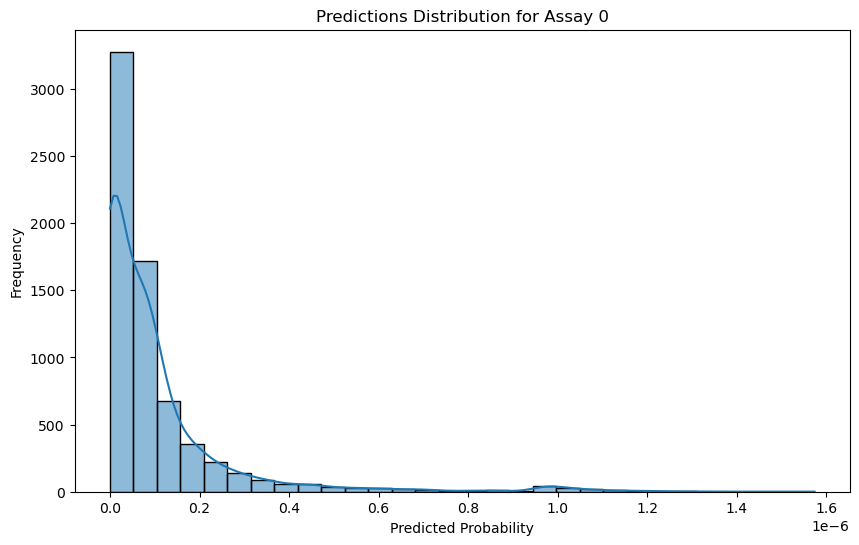

In [49]:
# Plot predictions for a single assay (e.g., assay index 0)
assay_index = 0
plt.figure(figsize=(10, 6))
sns.histplot(predictions[:, assay_index], kde=True, bins=30)
plt.title(f"Predictions Distribution for Assay {assay_index}")
plt.xlabel("Predicted Probability")
plt.ylabel("Frequency")
plt.show()
